# QVK plot

### import

In [1]:
import xml.etree.ElementTree as ET
import pandas as pd
import matplotlib.pyplot as plt
import re
from collections import defaultdict
import math

#import japanize_matplotlib

### data

In [ ]:
## step1
path_to_result_1 = 'data/plain_out.xml'
tree_1 = ET.parse(path_to_result_1)
root_1 = tree_1.getroot()

## step2
path_to_result_2 = 'data/step2_out.xml'
tree_2 = ET.parse(path_to_result_2)
root_2 = tree_2.getroot()

## step3
path_to_result_3 = 'data/step3_out.xml'
tree_3 = ET.parse(path_to_result_3)
root_3 = tree_3.getroot()

## step4
path_to_result_4 = 'data/step4_out.xml'
tree_4 = ET.parse(path_to_result_4)
root_4 = tree_4.getroot()

## データ前処理
data_dict_1 = {}
for data in root_1.findall('interval'):
  begin = data.get('begin')
  hour = int(float(begin))//3600
  id = data.get('id')
  n = float(data.get('flow'))
  v = float(data.get('speed')) * 3.6
  if v != 0:
    k = n / v
  else:
    k = 0

  if id not in data_dict_1:
    data_dict_1[id] = {"flow": [], "vel": [], "k": []}
  data_dict_1[id]["flow"].append(n)
  data_dict_1[id]["vel"].append(v)
  data_dict_1[id]["k"].append(k)

data_dict_2 = {}
for data in root_2.findall('interval'):
  begin = data.get('begin')
  hour = int(float(begin))//3600
  id = data.get('id')
  n = float(data.get('flow'))
  v = float(data.get('speed')) * 3.6
  if v != 0:
    k = n / v
  else:
    k = 0

  if id not in data_dict_2:
    data_dict_2[id] = {"flow": [], "vel": [], "k": []}
  data_dict_2[id]["flow"].append(n)
  data_dict_2[id]["vel"].append(v)
  data_dict_2[id]["k"].append(k)

data_dict_3 = {}
for data in root_3.findall('interval'):
  begin = data.get('begin')
  hour = int(float(begin))//3600
  id = data.get('id')
  n = float(data.get('flow'))
  v = float(data.get('speed')) * 3.6
  if v != 0:
    k = n / v
  else:
    k = 0

  if id not in data_dict_3:
    data_dict_3[id] = {"flow": [], "vel": [], "k": []}
  data_dict_3[id]["flow"].append(n)
  data_dict_3[id]["vel"].append(v)
  data_dict_3[id]["k"].append(k)

data_dict_4 = {}
for data in root_4.findall('interval'):
  begin = data.get('begin')
  hour = int(float(begin))//3600
  id = data.get('id')
  n = float(data.get('flow'))
  v = float(data.get('speed')) * 3.6
  if v != 0:
    k = n / v
  else:
    k = 0

  if id not in data_dict_4:
    data_dict_4[id] = {"flow": [], "vel": [], "k": []}
  data_dict_4[id]["flow"].append(n)
  data_dict_4[id]["vel"].append(v)
  data_dict_4[id]["k"].append(k)

### figure

##### 個別対応事例

['NationalRoute4_kudari_1_1']


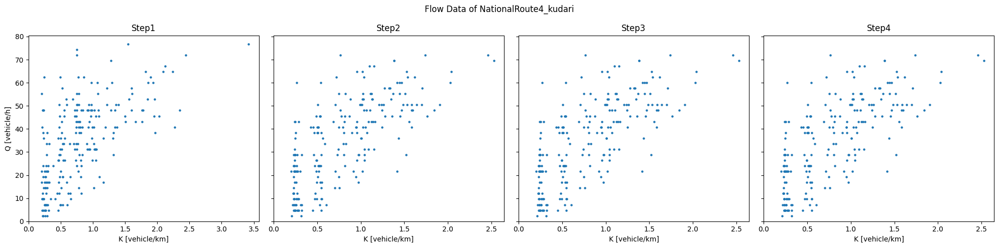

In [ ]:
# キーワードを指定
keyword = "NationalRoute4_kudari"

# 対象のキーを動的に抽出（両方に存在するキーのみ）
target_keys = [key for key in data_dict_1 if keyword in key]
print(target_keys)

# 初期化
combined_k_1 = pd.Series(dtype=float)
combined_q_1 = pd.Series(dtype=float)
combined_k_2 = pd.Series(dtype=float)
combined_q_2 = pd.Series(dtype=float)
combined_k_3 = pd.Series(dtype=float)
combined_q_3 = pd.Series(dtype=float)
combined_k_4 = pd.Series(dtype=float)
combined_q_4 = pd.Series(dtype=float)

# データの処理
for key in target_keys:
    if key not in data_dict_1 or key not in data_dict_2 or key not in data_dict_3 or key not in data_dict_4:
        continue  # キーが存在しない場合はスキップ

    # step1
    flow_series_1 = pd.Series(data_dict_1[key]["flow"]).rolling(window=5).mean()
    k_series_1 = pd.Series(data_dict_1[key]["k"])
    mask_1 = k_series_1 > 0.01
    combined_k_1 = pd.concat([combined_k_1, k_series_1[mask_1]], ignore_index=True)
    combined_q_1 = pd.concat([combined_q_1, flow_series_1[mask_1]], ignore_index=True)

    # step2
    flow_series_2 = pd.Series(data_dict_2[key]["flow"]).rolling(window=5).mean()
    k_series_2 = pd.Series(data_dict_2[key]["k"])
    mask_2 = k_series_2 > 0.01
    combined_k_2 = pd.concat([combined_k_2, k_series_2[mask_2]], ignore_index=True)
    combined_q_2 = pd.concat([combined_q_2, flow_series_2[mask_2]], ignore_index=True)

    # step3
    flow_series_3 = pd.Series(data_dict_3[key]["flow"]).rolling(window=5).mean()
    k_series_3 = pd.Series(data_dict_3[key]["k"])
    mask_3 = k_series_3 > 0.01
    combined_k_3 = pd.concat([combined_k_3, k_series_3[mask_3]], ignore_index=True)
    combined_q_3 = pd.concat([combined_q_3, flow_series_3[mask_3]], ignore_index=True)

    # step4
    flow_series_4 = pd.Series(data_dict_4[key]["flow"]).rolling(window=5).mean()
    k_series_4 = pd.Series(data_dict_4[key]["k"])
    mask_4 = k_series_4 > 0.01
    combined_k_4 = pd.concat([combined_k_4, k_series_4[mask_4]], ignore_index=True)
    combined_q_4 = pd.concat([combined_q_4, flow_series_4[mask_4]], ignore_index=True)

# グラフ描画（横4列で表示）
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=True)

titles = ["Step1", "Step2", "Step3", "Step4"]
k_values = [combined_k_1, combined_k_2, combined_k_3, combined_k_4]
q_values = [combined_q_1, combined_q_2, combined_q_3, combined_q_4]

for i, ax in enumerate(axes):
    ax.scatter(k_values[i], q_values[i], s=5)
    ax.set_title(titles[i])
    ax.set_xlabel("K [vehicle/km]")
    if i == 0:
        ax.set_ylabel("Q [vehicle/h]")
    ax.set_xlim(0, None)  ###横軸の幅を揃えたい場合はここを変更
    ax.set_ylim(0, None)  ###縦軸の幅を揃えたい場合はここを変更

plt.suptitle("Flow Data of " + keyword)
plt.tight_layout()
plt.show()


#### 一覧表示（末尾が数字限定）

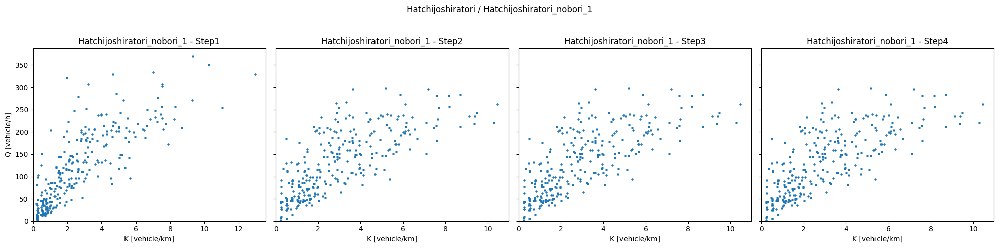

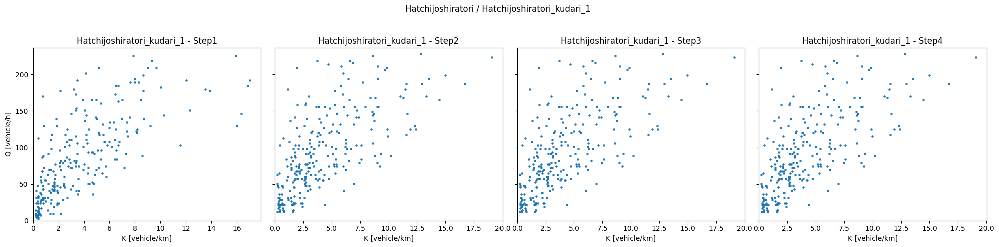

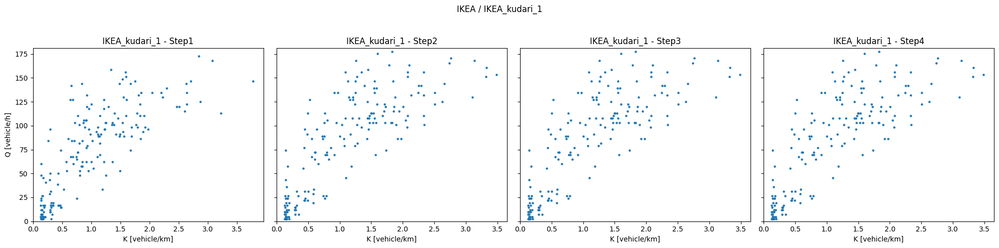

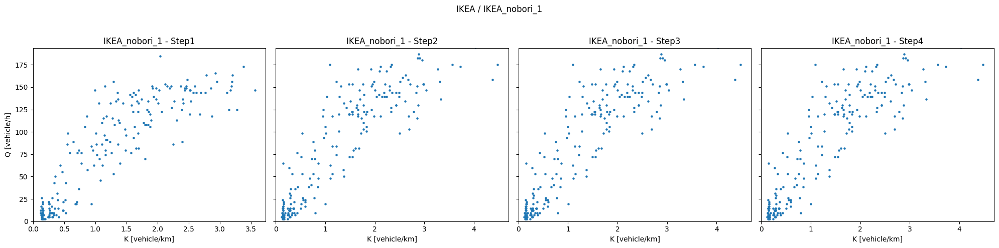

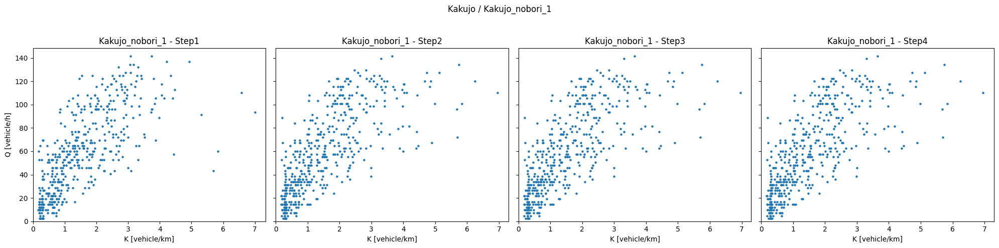

...

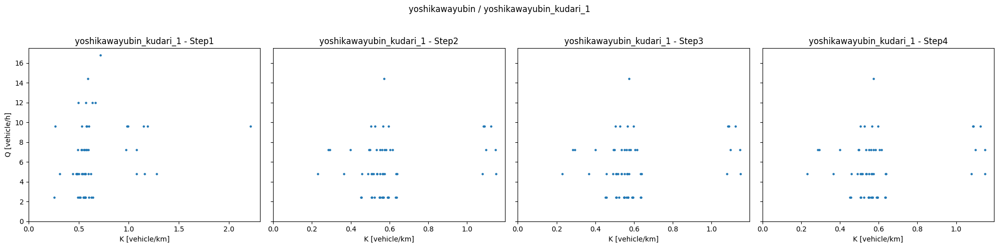

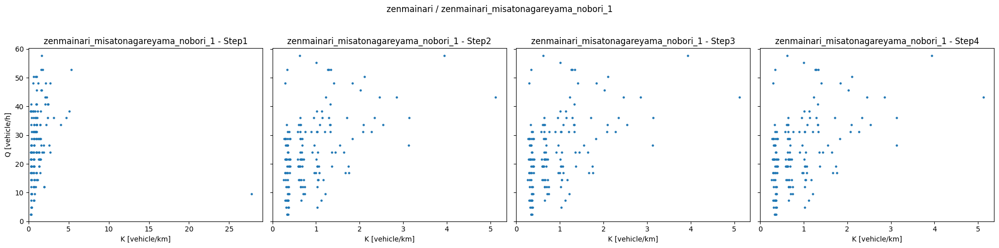

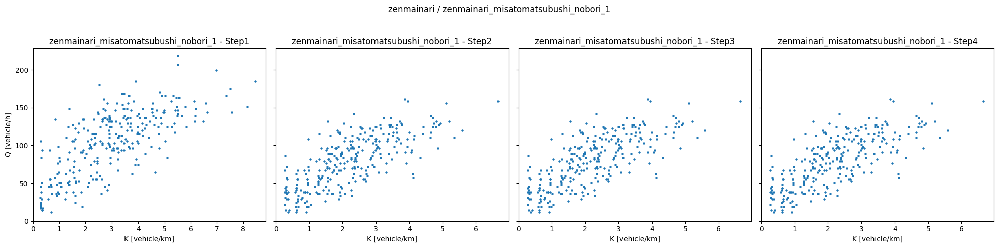

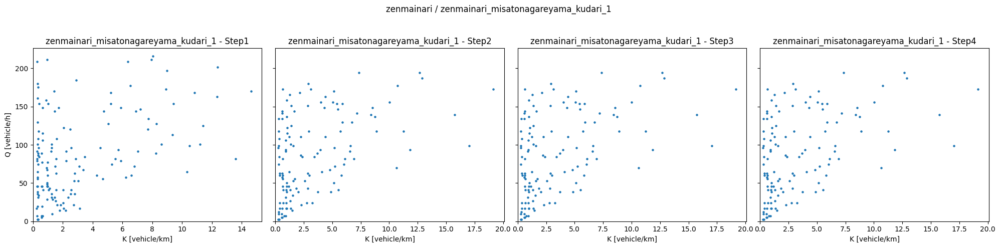

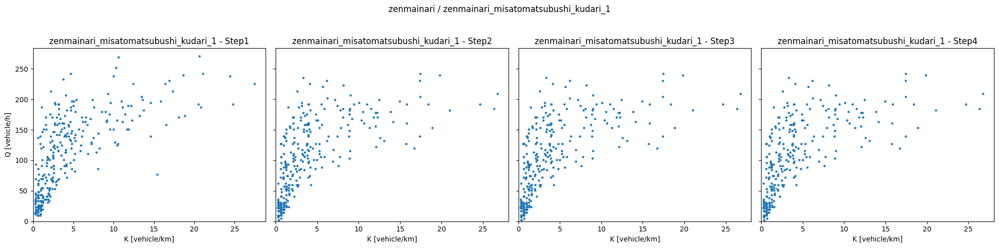

In [7]:
import re
import matplotlib.pyplot as plt
import pandas as pd
import math
from collections import defaultdict

# 共通キーの取得
all_keys = set(data_dict_1.keys()) & set(data_dict_2.keys()) & set(data_dict_3.keys()) & set(data_dict_4.keys())

# プレフィックス抽出関数
def extract_prefix(key):
    return re.sub(r'_\d+$', '', key)

def extract_top_prefix(key):
    return key.split('_')[0]

# プレフィックスごとにキーをグループ化
grouped_by_prefix = defaultdict(list)
for key in all_keys:
    prefix = extract_prefix(key)
    grouped_by_prefix[prefix].append(key)

# トッププレフィックスごとに再グループ化
grouped_by_top_prefix = defaultdict(dict)
for prefix, keys in grouped_by_prefix.items():
    top_prefix = extract_top_prefix(prefix)
    grouped_by_top_prefix[top_prefix][prefix] = keys

# グループ単位でプロット
for top_prefix, subgroups in sorted(grouped_by_top_prefix.items()):
    for prefix, keys in subgroups.items():
        # 各 prefix（例: NationalRoute4_kudari）ごとに 1行4列のプロットを作成
        fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=True)

        # 初期化
        combined_k_1 = pd.Series(dtype=float)
        combined_q_1 = pd.Series(dtype=float)
        combined_k_2 = pd.Series(dtype=float)
        combined_q_2 = pd.Series(dtype=float)
        combined_k_3 = pd.Series(dtype=float)
        combined_q_3 = pd.Series(dtype=float)
        combined_k_4 = pd.Series(dtype=float)
        combined_q_4 = pd.Series(dtype=float)

        for key in keys:
            # 安全チェック
            if key not in data_dict_1 or key not in data_dict_2 or key not in data_dict_3 or key not in data_dict_4:
                continue

            # step1
            flow_1 = pd.Series(data_dict_1[key]["flow"]).rolling(window=5).mean()
            k_1 = pd.Series(data_dict_1[key]["k"])
            mask_1 = k_1 > 0.01
            combined_k_1 = pd.concat([combined_k_1, k_1[mask_1]], ignore_index=True)
            combined_q_1 = pd.concat([combined_q_1, flow_1[mask_1]], ignore_index=True)

            # step2
            flow_2 = pd.Series(data_dict_2[key]["flow"]).rolling(window=5).mean()
            k_2 = pd.Series(data_dict_2[key]["k"])
            mask_2 = k_2 > 0.01
            combined_k_2 = pd.concat([combined_k_2, k_2[mask_2]], ignore_index=True)
            combined_q_2 = pd.concat([combined_q_2, flow_2[mask_2]], ignore_index=True)

            # step3
            flow_3 = pd.Series(data_dict_3[key]["flow"]).rolling(window=5).mean()
            k_3 = pd.Series(data_dict_3[key]["k"])
            mask_3 = k_3 > 0.01
            combined_k_3 = pd.concat([combined_k_3, k_3[mask_3]], ignore_index=True)
            combined_q_3 = pd.concat([combined_q_3, flow_3[mask_3]], ignore_index=True)

            # step4
            flow_4 = pd.Series(data_dict_4[key]["flow"]).rolling(window=5).mean()
            k_4 = pd.Series(data_dict_4[key]["k"])
            mask_4 = k_4 > 0.01
            combined_k_4 = pd.concat([combined_k_4, k_4[mask_4]], ignore_index=True)
            combined_q_4 = pd.concat([combined_q_4, flow_4[mask_4]], ignore_index=True)

        # 各軸にプロット
        steps = [(combined_k_1, combined_q_1), (combined_k_2, combined_q_2),
                 (combined_k_3, combined_q_3), (combined_k_4, combined_q_4)]

        for i, (k, q) in enumerate(steps):
            ax = axes[i]
            ax.scatter(k, q, s=5)
            ax.set_title(f"{prefix} - Step{i+1}")
            ax.set_xlabel("K [vehicle/km]")
            if i == 0:
                ax.set_ylabel("Q [vehicle/h]")
            ax.set_xlim(0, None)
            ax.set_ylim(0, None)

        plt.suptitle(f"{top_prefix} / {prefix}")
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
